In [2]:
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import sys
from matplotlib.colors import LogNorm


from photutils.detection import DAOStarFinder
from photutils.detection import IRAFStarFinder

from astropy.stats import mad_std
import time

from lvmtipo.actors import lvm
from lvmagp.focus import Focus

import asyncio

from cluplus.proxy import invoke

from lvmtipo.actors import lvm
from lvmagp.images import Image
from plotimg import plot_images

from IPython.display import clear_output
from logging import DEBUG

#from sdsstools.logger import StreamFormatter
#from sdsstools import get_logger, read_yaml_file
#from sdsstools.logger import SDSSLogger

import numpy as np

from astropy.coordinates import SkyCoord, Angle
import astropy.wcs
import astropy.units as u

In [3]:
# define telescope
tel = lvm.spec

#  
await tel.start()

focus = Focus(tel)

await tel.foc.status()

{'Reachable': True,
 'AtHome': False,
 'Moving': False,
 'PositionSwitchStatus': 0,
 'Position': 37.536,
 'DeviceEncoder': {'Position': -1232.0, 'Unit': 'STEPS'},
 'Velocity': 0.0,
 'AtLimit': False}

In [39]:
await tel.agc.status()
import time

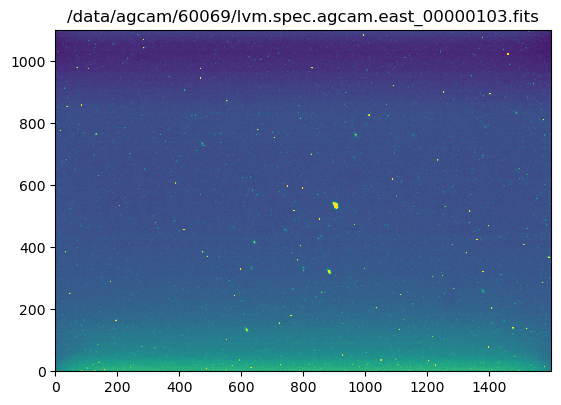

In [51]:
exptime = 10
rc = await tel.agc.expose( exptime)
filenames = rc.flatten().unpack("*.filename")

hdul = fits.open(filenames)
img = hdul[0].data
imglow = np.nanmedian(img) - np.nanstd(img)
imghigh = np.nanmedian(img) + 3* np.nanstd(img)
plt.imshow(img, origin="lower", vmin=imglow, vmax=imghigh)
plt.title(filenames)
plt.show()

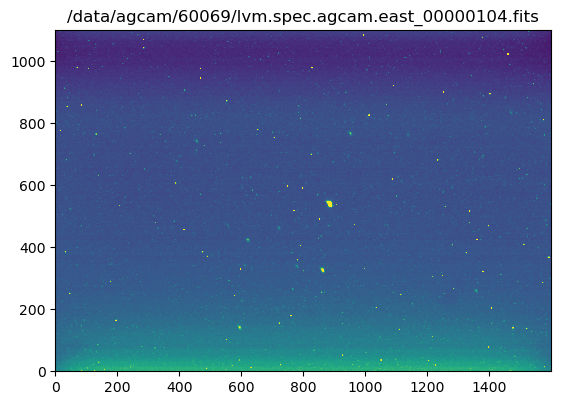

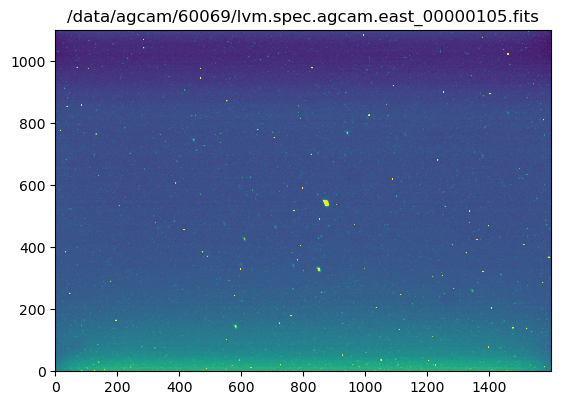

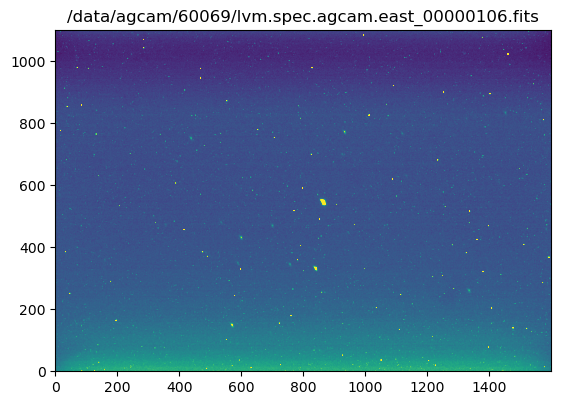

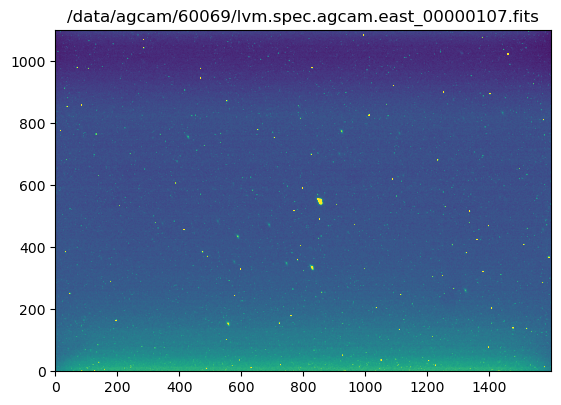

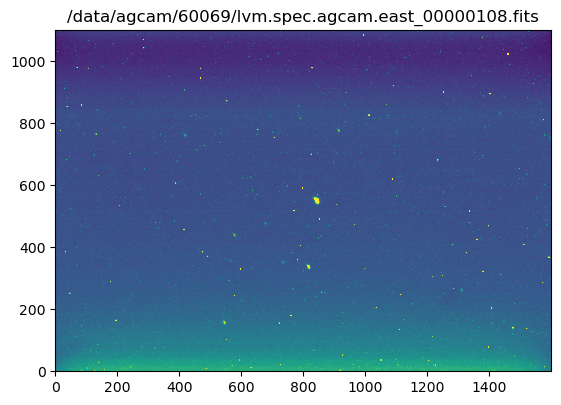

...

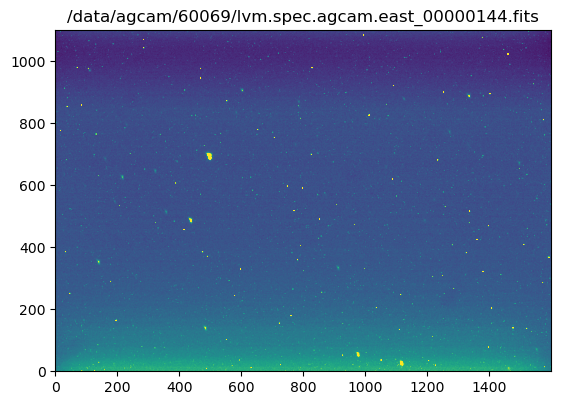

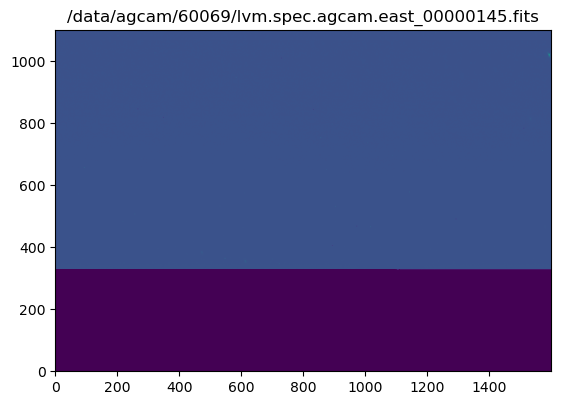

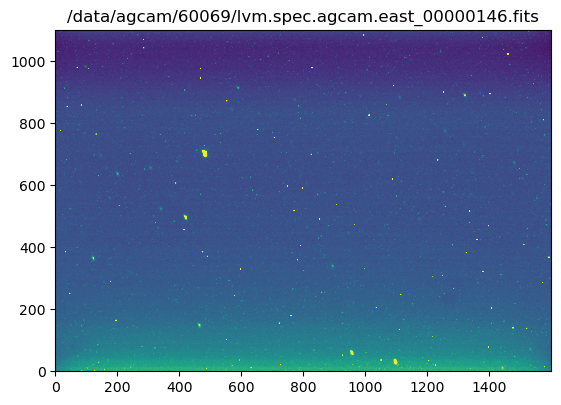

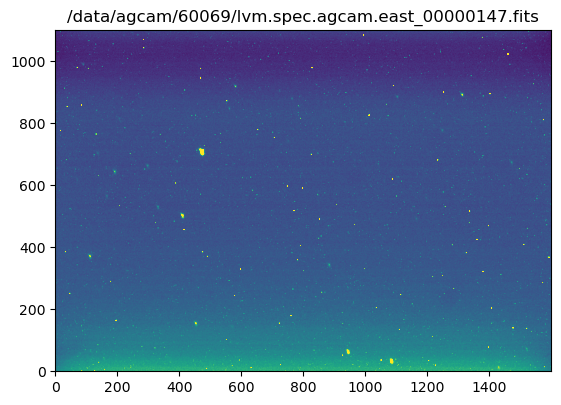

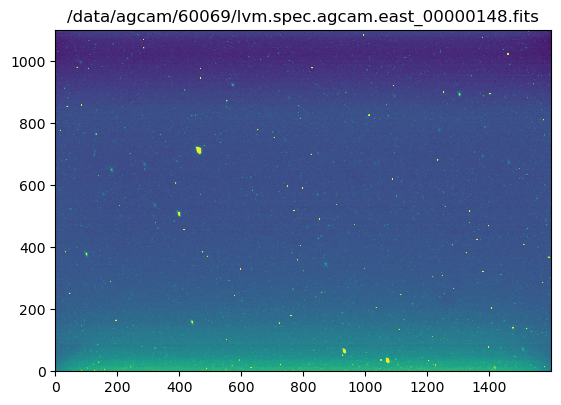

In [52]:
for i in range(45):
    time.sleep(20)
    exptime = 10
    rc = await tel.agc.expose( exptime)
    filenames = rc.flatten().unpack("*.filename")
    
    hdul = fits.open(filenames)
    img = hdul[0].data
    imglow = np.nanmedian(img) - np.nanstd(img)
    imghigh = np.nanmedian(img) + 3* np.nanstd(img)
    plt.imshow(img, origin="lower", vmin=imglow, vmax=imghigh)
    plt.title(filenames)
    plt.show()

In [53]:
await tel.pwi.park() # goto park position
await tel.pwi.setEnabled(False) # disengage motors (telescope should be free floating now)

{'is_enabled': False,
 'axis0': {'is_enabled': False},
 'axis1': {'is_enabled': False}}